In [1]:
import numpy as np
import pandas as pd 
import xgboost as xgb
import matplotlib.pyplot as plt
import pickle
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.sandbox.regression.predstd import wls_prediction_std
import datetime
import xlrd
import os
import re
from scipy.stats import kstest
from scipy.spatial.distance import directed_hausdorff
from scipy import optimize
import pwlf
from scipy.optimize import minimize
from pyecharts import options as opts
from pyecharts.charts import Calendar
from matplotlib.ticker import FuncFormatter
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import math
from sklearn.exceptions import ConvergenceWarning
import warnings
import contextlib
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_pacf,plot_acf
warnings.filterwarnings("ignore")

In [2]:
import importlib
importlib.reload(pwlf)

<module 'pwlf' from 'd:\\anaconda\\Lib\\site-packages\\pwlf\\__init__.py'>

In [22]:
# load day ahead price data from E:\day-ahead price\Data\ISO_New_England\day_ahead_price
path = r'E:\day-ahead price\Data\ISO_New_England\day_ahead_price'
os.chdir(path)
files = os.listdir(path)
df = pd.DataFrame()
for file in files:
    delimiter = ','
    max_columns = max(open(file), key=lambda x: x.count(delimiter)).count(delimiter)
    df_tmp = pd.read_csv(file, header=None, names=list(range(max_columns+1)))
    # print(df_tmp)
    df = pd.concat([df, df_tmp])
df.columns = df.iloc[4]
df = df[df['H'] == 'D'].drop(['H'], axis = 1).reset_index(drop = True)
# average price by Date and Hour Ending
tmp = []
df['Hour Ending'] = df['Hour Ending'].astype(str)
df['Date'] = pd.to_datetime(df['Date'])
df['Date'] = df['Date'].dt.strftime('%Y-%m-%d')
df['Locational Marginal Price'] = df['Locational Marginal Price'].astype(float)
df['Energy Component'] = df['Energy Component'].astype(float)
df['Congestion Component'] = df['Congestion Component'].astype(float)
df['Marginal Loss Component'] = df['Marginal Loss Component'].astype(float)
df_group = df.groupby(['Date', 'Hour Ending'])
for [Date, Hour_Ending], group in df_group:
    Locational_Marginal_Price = group['Locational Marginal Price'].mean() 
    Energy_Component = group['Energy Component'].mean()
    Congestion_Component = group['Congestion Component'].mean()
    Marginal_Loss_Component = group['Marginal Loss Component'].mean()
    tmp.append([Date, Hour_Ending, Locational_Marginal_Price, Energy_Component, Congestion_Component, Marginal_Loss_Component])
df_price = pd.DataFrame(tmp, columns = ['Date', 'Hour Ending', 'Locational Marginal Price', 'Energy Component', 'Congestion Component', 'Marginal Loss Component'])
df_price

,Date,Hour Ending,Locational Marginal Price,Energy Component,Congestion Component,Marginal Loss Component
0,2022-01-01,01,32.124229,32.35,-0.089337,-0.136434
1,2022-01-01,02,32.057678,32.31,-0.111808,-0.140514
2,2022-01-01,03,30.726426,30.85,0.000000,-0.123574
3,2022-01-01,04,29.569668,29.69,0.000000,-0.120332
4,2022-01-01,05,30.738126,30.86,0.000000,-0.121874
...,...,...,...,...,...,...
16315,2023-11-11,20,40.609046,40.90,-0.030929,-0.260025
16316,2023-11-11,21,40.179589,40.43,-0.028840,-0.221571
16317,2023-11-11,22,39.871406,40.09,-0.032385,-0.186209
16318,2023-11-11,23,29.190831,29.34,-0.002179,-0.146990


In [23]:
# df_price lack a line of data in Date 2023-03-12, Hour Ending 3, so we need to add this line by average of Hour Ending 2 and Hour Ending 4
lost_data = pd.DataFrame({'Date': '2023-03-12', 'Hour Ending': '03', 'Locational Marginal Price': (df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '02')]['Locational Marginal Price'].values[0] + df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '04')]['Locational Marginal Price'].values[0])/2, 'Energy Component': (df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '02')]['Energy Component'].values[0] + df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '04')]['Energy Component'].values[0])/2, 'Congestion Component': (df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '02')]['Congestion Component'].values[0] + df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '04')]['Congestion Component'].values[0])/2, 'Marginal Loss Component': (df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '02')]['Marginal Loss Component'].values[0] + df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '04')]['Marginal Loss Component'].values[0])/2}, index = [0])
df_price = pd.concat([df_price, lost_data]).sort_values(by = ['Date', 'Hour Ending']).reset_index(drop = True)
# delete the line of data in Date 2023-11-05, whose Hour Ending = '02X' 
df_price = df_price.drop(df_price[(df_price['Date'] == '2023-11-05') & (df_price['Hour Ending'] == '02X')].index).reset_index(drop = True)
# delete the line of data in Date 2022-11-06, whose Hour Ending = '02X' 
df_price = df_price.drop(df_price[(df_price['Date'] == '2022-11-06') & (df_price['Hour Ending'] == '02X')].index).reset_index(drop = True)
df_price['Hour Ending'] = df_price['Hour Ending'].astype(int)
df_price['Date'] = pd.to_datetime(df_price['Date'])
df_price

,Date,Hour Ending,Locational Marginal Price,Energy Component,Congestion Component,Marginal Loss Component
0,2022-01-01,1,32.124229,32.35,-0.089337,-0.136434
1,2022-01-01,2,32.057678,32.31,-0.111808,-0.140514
2,2022-01-01,3,30.726426,30.85,0.000000,-0.123574
3,2022-01-01,4,29.569668,29.69,0.000000,-0.120332
4,2022-01-01,5,30.738126,30.86,0.000000,-0.121874
...,...,...,...,...,...,...
16314,2023-11-11,20,40.609046,40.90,-0.030929,-0.260025
16315,2023-11-11,21,40.179589,40.43,-0.028840,-0.221571
16316,2023-11-11,22,39.871406,40.09,-0.032385,-0.186209
16317,2023-11-11,23,29.190831,29.34,-0.002179,-0.146990


(-6.904120353181455, 1.259997783439283e-09, 43, 16276, {'1%': -3.430751839004321, '5%': -2.8617175964787895, '10%': -2.566864530141644}, 117240.15206590068)


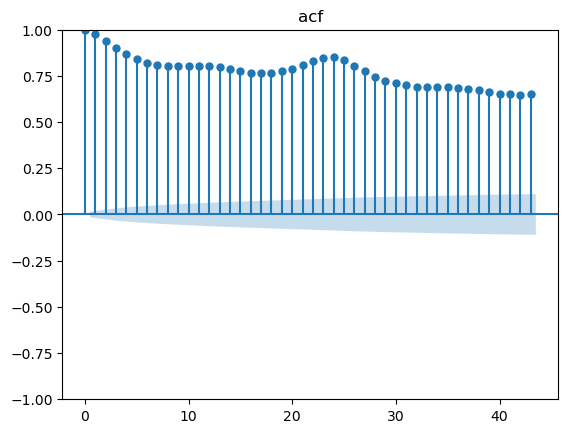

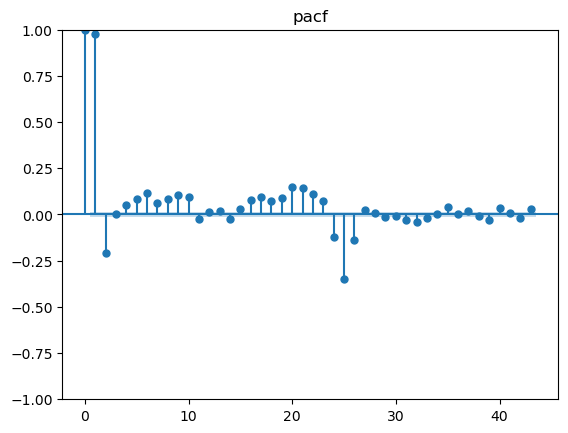

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
6,77931.278999,0.0,77905.989205,0.0
12,141243.398504,0.0,141173.527097,0.0


In [6]:
train = df_price['Locational Marginal Price']

# 单位根检验-ADF检验
print(sm.tsa.stattools.adfuller(train))
# 计算ACF
acf=plot_acf(train)
plt.title("acf")
plt.show()
# PACF
pacf=plot_pacf(train)
plt.title("pacf")
plt.show()

# 白噪声检验
acorr_ljungbox(train, lags = [6, 12],boxpierce=True)


In [7]:
def loss(target, prediction):
    if np.isnan(target).all() or np.isnan(prediction).all():
        return 0, 0, 0, 0
    from math import sqrt
    error = []
    pError = []
    for i in range(len(target)):
        error.append(target[i] - prediction[i])
        
        # if target[i] < 55:
        #     a = 55
        # else:
        #     a = target[i]
        # if prediction[i] < 55:
        #     b = 55
        # else:
        #     b = prediction[i]
        pError.append(abs(target[i] - prediction[i]) / ((abs(target[i]) + abs(prediction[i]))/2))

    squaredError = []
    absError = []
    for val in error:
        squaredError.append(val * val)#target-prediction之差平方 
        absError.append(abs(val))#误差绝对值
    mse = sum(squaredError) / len(squaredError)#均方误差MSE
    rmse = sqrt(sum(squaredError) / len(squaredError))#均方根误差RMSE
    mae = sum(absError) / len(absError)#平均绝对误差MAE
    smape = sum(pError) / len(absError)
    return mse, rmse, mae, smape


In [8]:
# use df_price and arima model to predict the price of 2023-01-01 to 2023-10-31

df_price['Date'] = pd.to_datetime(df_price['Date'])
df_price['Hour Ending'] = df_price['Hour Ending'].astype(str)
def get_price_data(tgt_dt):
    df_1 = df_price[df_price['Date'] == tgt_dt].reset_index(drop=True)
    return df_1

def get_x_y(tgt_dt):
    x = []
    for _ in pd.date_range(tgt_dt - datetime.timedelta(60), tgt_dt - datetime.timedelta(1)):
        df_1 = get_price_data(_)
        if len(df_1) == 24:
            x.append(df_1['Locational Marginal Price'].values)
    x = np.array(x).reshape(-1)
    y = get_price_data(tgt_dt)['Locational Marginal Price'].values
    return x, y


In [9]:
def pred_by_arima(tgt_day):
    x, y_truth = get_x_y(tgt_day)
    # print(train)
    model = SARIMAX(x, order=(5,0,3), seasonal_order=(1,0,1,24))
    try:
        arima_res=model.fit()
    except:
        return [], []
    arima_res.summary()
    # predict next 24 hours' price
    predict=arima_res.forecast(24)
    # print(predict)
    return predict, y_truth
pred = []
pred1 = []

truth = []
x_label = []
xgb.set_config(verbosity=0)
for _ in pd.date_range(pd.to_datetime('2023/1/1'),pd.to_datetime('2023/10/31')):
    y_pred, y_truth = pred_by_arima(_)
    
    if not (np.size(y_pred) == 0 or np.size(y_truth) == 0):
        pred.append(y_pred)
        truth.append(y_truth)
        x_label.append(_)


In [10]:
df_pred = pd.DataFrame([x_label, pred, truth]).T
df_pred.columns = ['Date', 'pred', 'truth']
df_pred['Date'] = pd.to_datetime(df_pred['Date'])
df_pred

,Date,pred,truth
0,2023-01-01,"[37.290095175330684, 34.17194058958554, 33.610...","[31.08916940789473, 28.27474506578947, 26.6740..."
1,2023-01-02,"[32.82861652075823, 31.169980871210736, 31.845...","[33.687787828947364, 30.903889802631582, 30.87..."
2,2023-01-03,"[39.07136508282996, 35.8196770207014, 35.26618...","[42.11875, 39.511628289473684, 38.518347039473..."
3,2023-01-04,"[35.070598590759495, 32.73269807114797, 31.422...","[37.99967927631579, 36.68687500000001, 37.9354..."
4,2023-01-05,"[34.23773289728797, 30.94428919787928, 29.5357...","[31.37074835526316, 30.577491776315785, 28.825..."
...,...,...,...
298,2023-10-27,"[27.958718499928274, 24.726769210417476, 24.16...","[24.05723684210526, 21.355559210526316, 17.052..."
299,2023-10-28,"[21.193840632955254, 18.743101650273918, 16.50...","[27.272524671052633, 23.527705592105264, 21.66..."
300,2023-10-29,"[25.380624360885776, 23.1746272396611, 20.5823...","[25.02483552631579, 18.672598684210524, 18.611..."
301,2023-10-30,"[31.06010559043033, 25.705401138083424, 23.549...","[23.506636513157893, 24.447261513157898, 20.50..."


In [12]:
path = r'E:\day-ahead price\Code\ISO_New_England'
os.chdir(path)
df_pred.to_csv('arima_pred.csv', index = False)

In [13]:
df_pred = pd.read_csv('arima_pred.csv')
df_pred.columns = ['Date', 'pred', 'truth']
df_pred['Date'] = pd.to_datetime(df_pred['Date'])
df_pred

,Date,pred,truth
0,2023-01-01,[ 37.29009518 34.17194059 33.61093851 35.33...,[31.08916941 28.27474507 26.67407072 28.031077...
1,2023-01-02,[ 32.82861652 31.16998087 31.84536545 34.21...,[33.68778783 30.9038898 30.87960526 30.727425...
2,2023-01-03,[ 39.07136508 35.81967702 35.26618932 36.71...,[42.11875 39.51162829 38.51834704 40.938601...
3,2023-01-04,[ 35.07059859 32.73269807 31.42261012 32.21...,[37.99967928 36.686875 37.93543586 35.935797...
4,2023-01-05,[34.2377329 30.9442892 29.53579658 29.943490...,[31.37074836 30.57749178 28.82582237 30.084753...
...,...,...,...
298,2023-10-27,[27.9587185 24.72676921 24.16908962 22.886594...,[24.05723684 21.35555921 17.05250822 16.906677...
299,2023-10-28,[21.19384063 18.74310165 16.50245178 15.754767...,[27.27252467 23.52770559 21.66129934 20.783412...
300,2023-10-29,[25.38062436 23.17462724 20.58236327 18.844218...,[25.02483553 18.67259868 18.61174342 17.390592...
301,2023-10-30,[31.06010559 25.70540114 23.54981917 23.181128...,[23.50663651 24.44726151 20.50105263 18.648799...


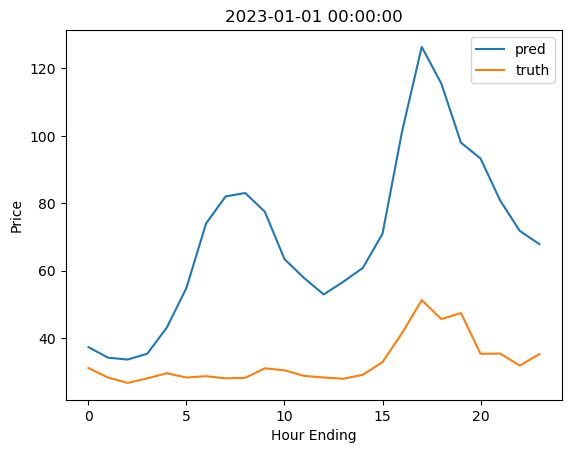

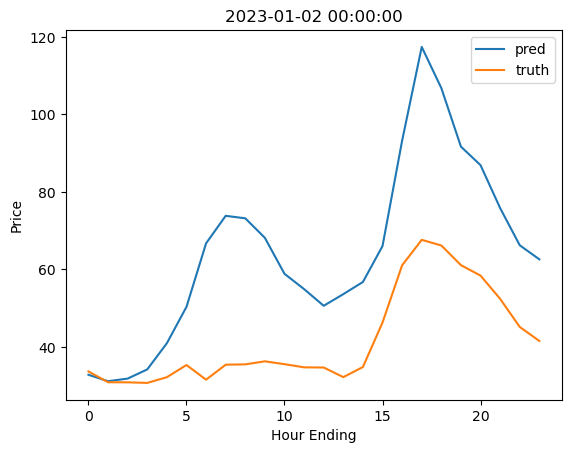

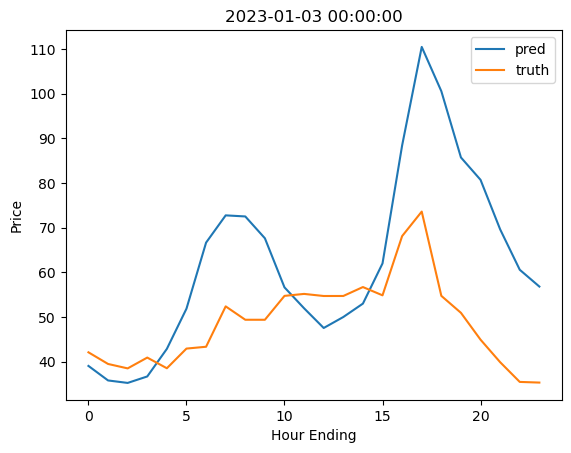

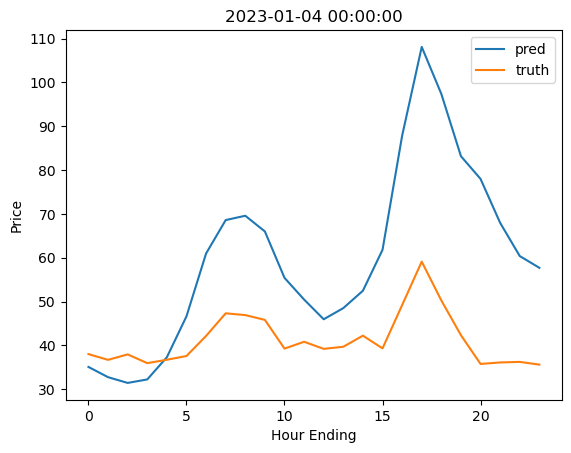

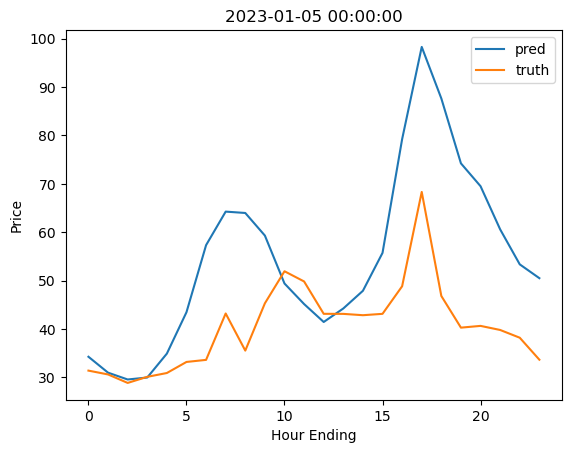

...

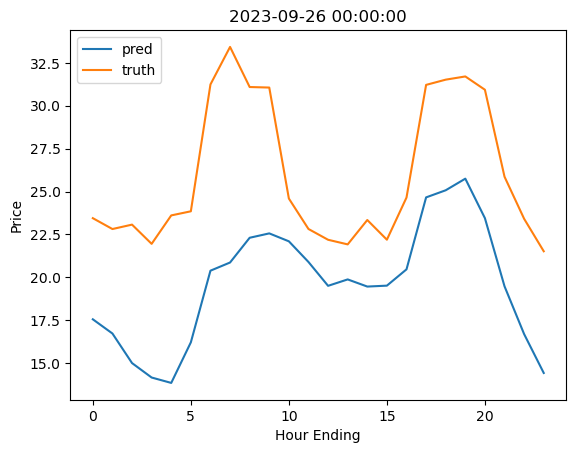

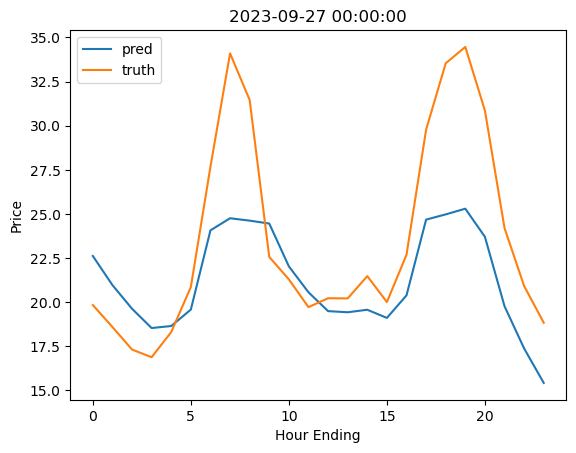

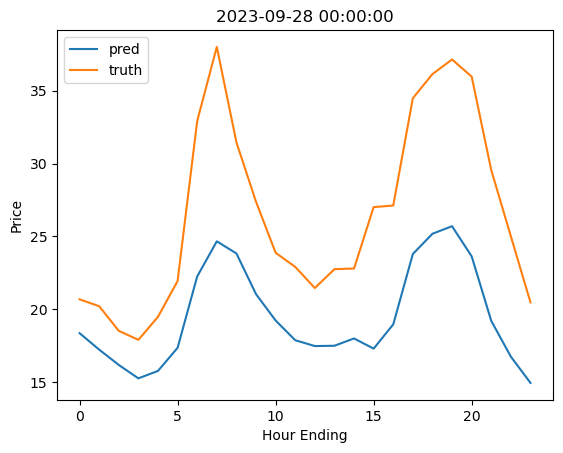

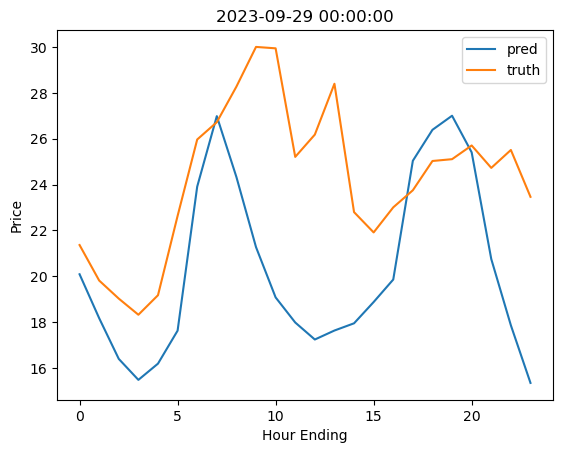

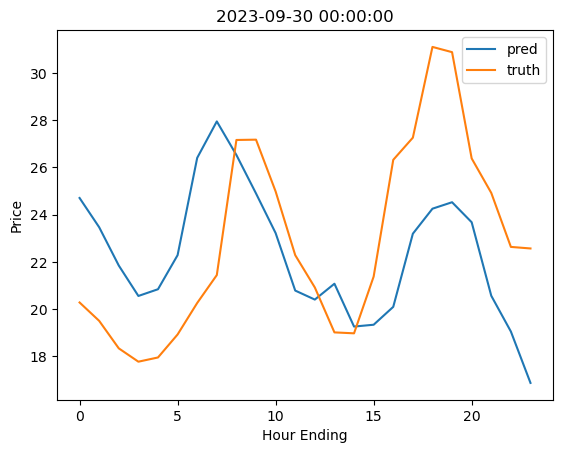

In [25]:
x_label = []
mae_list = []
smape_list = []
for _ in range(len(df_pred)):
    if pd.to_datetime('2023/1/1') <= df_pred['Date'][_] <= pd.to_datetime('2023/9/30'):
        pred_by_lstm = np.array(list(map(float, df_pred['pred'][_].replace(" ", ",").replace("\n", "").replace(",,", ",").replace(",,", ",").replace(",,", ",").replace(",,", ",").strip("[]").strip("\n").strip(",").split(","))))
        truth_price = get_price_data(df_pred['Date'][_])['Locational Marginal Price'].values
        pred_by_lstm[pred_by_lstm < 0] = 0
        plt.plot(pred_by_lstm, label='pred')
        plt.plot(truth_price, label='truth')
        plt.title(df_pred['Date'][_])
        # plt.ylim(0, 450)
        plt.xlabel('Hour Ending')
        plt.ylabel('Price')
        plt.legend()
        plt.show()
        mse, rmse, mae, smape = loss(truth_price, pred_by_lstm)
        mae_list.append(mae)
        smape_list.append(smape)
df_loss = pd.DataFrame([x_label, mae_list, smape_list]).T
df_loss.columns = ['Date', 'MAE', 'SMAPE']

In [26]:
pd.DataFrame([df_loss['MAE'].mean(), df_loss['SMAPE'].mean()])

,0
0,9.365622
1,0.211140
